In [1]:
# general
import os
BASE_DIR = os.path.dirname(os.path.dirname(os.path.abspath('__file__')))

from pathlib import Path

# computation
import pandas as pd

# plotting
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [2]:
stations = ['Neak_Luong', 'Stung_Treng', 'Chaktomuk', 'Kompong_Kdei', 'Prek_Kdam', 'Kg._Thmar',
            'Koh_Khel', 'Lumphat', 'Kompong_Cham', 'Phnom_Penh_Port', 'Voeun_Sai', 'Kratie', 
            'Kompong_Chen', 'Kompong_Cham', 'Sisophon'
           ]
# 'Kompong_Thom', 'Battambang', 'Siempang'

In [3]:
Path(f'{BASE_DIR}/spt_vs_mrc/').mkdir(parents=True, exist_ok=True)

dfs_obs = []
dfs_pred = []

for station in stations:
    obs = pd.read_csv(f'{BASE_DIR}/mrc_observations/{station}.csv')
    obs['datetime'] = pd.to_datetime(obs['datetime'])
    dfs_obs.append({'station': station, 'df': obs})

    pred = pd.read_csv(f'{BASE_DIR}/spt_predictions/{station}.csv')
    pred['datetime'] = pd.to_datetime(obs['datetime'])
    dfs_pred.append({'station': station, 'df': pred})

    obs = obs.rename(columns={'discharge': 'observation'})
    pred = pred.rename(columns={'discharge': 'prediction'})
    df = pd.merge(obs, pred, how='inner', on='datetime')
    df.sort_values(by=['datetime'], ascending=True, inplace=True)
#     df.to_csv(f'{BASE_DIR}/spt_vs_mrc/{station}.csv', encoding='utf-8', index=False)

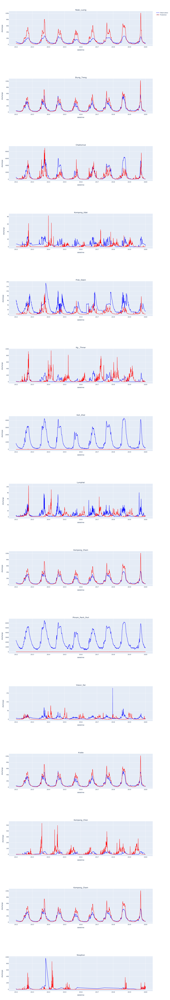

In [4]:
fig = make_subplots(rows=len(dfs_obs), cols=1, start_cell='top-left', subplot_titles=[df['station'] for df in dfs_obs])
for idx, df_obs in enumerate(dfs_obs):
    name = df_obs['station']
    
        # webgl for fast render
    fig.add_trace(go.Scattergl(x=df_obs['df'].datetime,
                               y=df_obs['df'].discharge,
#                                name=f'{name} observed',
                               name=f'Observation',
                               mode='lines',
                               line=dict(color='blue'),
                               showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)

    fig.add_trace(go.Scattergl(x=dfs_pred[idx]['df'].datetime,
                               y=dfs_pred[idx]['df'].discharge,
                               mode='lines+text',
#                                name = f'{dfs_pred[idx]["station"]} predicted',
                               name = f'Prediction',
                               line=dict(color='red'),
                               showlegend=True if idx == 0 else False,
                              ),
                  row=idx+1, col=1)

    fig.update_xaxes(title_text='datetime', row=idx+1, col=1)
    fig.update_yaxes(title_text='discharge', row=idx+1, col=1)

fig.update_layout(height=len(dfs_obs)*600, width=1000)
fig.show()